# Scene Classification using CNN

### Steps:

1. Importing (or installing) Tenosrflow, Keras and other packages on your system
2. Loading your data from disk
3. Creating your training and testing splits
4. Data Preprocessing 
5. Defining your tensorflow ANN model architecture
6. Compiling your tensorflow ANN model
7. Training your model on your training data
8. Evaluating your model on your test data
9. Generate Plots for accuracy and validation loss
10. Saving The train model
11. Making predictions using your trained tensorflow model

### Step 1: Importing all the packages

In [3]:
# import the necessary packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import random
import cv2
import os

import warnings
from tqdm import tqdm_notebook as tqdm
import itertools

warnings.filterwarnings("ignore")
SEED = 42   # set random seed

### Step 2: Define the architecture for CNN MODEL

In [2]:
# create CNN Model

class LeNet:
    @staticmethod
    def build(width, height, depth, classes):
        # initialize the model
        model = Sequential()
        inputShape = (height, width, depth)

        # if we are using "channels first", update the input shape
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))

        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model


In [6]:
DATASET = "dataset"  # this folde must contain three subfolder with images
MODEL = "Scene.model" # name to store the model on disk
PLOT = "plot.png" # plot name

In [5]:
# initialize the number of epochs to train for, initia learning rate,
# and batch size
EPOCHS = 25
INIT_LR = 1e-3
BS = 32

### Step 3: Loading your data from disk for training

In [7]:
# initialize the data and labels
print("[INFO] loading images...")
data = []
labels = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(DATASET)))
random.seed(42)
random.shuffle(imagePaths)

# progress bar 
with tqdm(total=len(imagePaths)) as pbar:
    
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        data.append(image)

        # extract the class label from the image path and update the
        # labels list
        label = imagePath.split(os.path.sep)[-2]

        

        if label == "Buildings":
            label = 0
        elif label == "Forest":
            label = 1
        elif label == "Sea":
            label = 2

        # print("pr: ", label)	

        labels.append(label)
        
        # update the progressbar
        pbar.update(1)

[INFO] loading images...


  0%|          | 0/1326 [00:00<?, ?it/s]

In [8]:
# scale the raw pixel intensities to the range [0, 1]
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [10]:
labels

array([0, 1, 0, ..., 0, 0, 2])

### Step 4: Creating your training and testing splits

In [11]:
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.25, random_state=42)

In [12]:
trainX.shape

(994, 28, 28, 3)

In [14]:
trainY.shape

(994,)

In [15]:
trainY = to_categorical(trainY, num_classes=3)
testY = to_categorical(testY, num_classes=3)

In [16]:
trainY[0]

array([1., 0., 0.], dtype=float32)

### Step 5: Data Preprocessing (Augumentation)

In [19]:
# construct the image generator for data augmentation
aug = ImageDataGenerator(rotation_range=30, 
                         width_shift_range=0.1, 
                         height_shift_range=0.1, 
                         shear_range=0.2, 
                         zoom_range=0.2, 
                         horizontal_flip=True, 
                         fill_mode="nearest")

### Step 6: Compiling your tensorflow CNN model

In [20]:
# initialize the model
print("[INFO] compiling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=3)
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

print("[INFO] model complied...")

[INFO] compiling model...
[INFO] model complied...


In [21]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 20)        1520      
_________________________________________________________________
activation (Activation)      (None, 28, 28, 20)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 20)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 50)        25050     
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 50)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 50)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2450)              0

### Step 7: Training your model on your training data

In [22]:
# train the network
print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(testX, testY), 
              steps_per_epoch=len(trainX) // BS,
              epochs=EPOCHS, 
              verbose=1)

[INFO] training network...
Train for 31 steps, validate on 332 samples
Epoch 1/25
31/31 [==============================] - 15s 484ms/step - loss: 0.8892 - accuracy: 0.5759 - val_loss: 0.7146 - val_accuracy: 0.6024
Epoch 2/25
31/31 [==============================] - 3s 105ms/step - loss: 0.7282 - accuracy: 0.6653 - val_loss: 0.5425 - val_accuracy: 0.7861
Epoch 3/25
31/31 [==============================] - 3s 110ms/step - loss: 0.6288 - accuracy: 0.7214 - val_loss: 0.5450 - val_accuracy: 0.7530
Epoch 4/25
31/31 [==============================] - 4s 123ms/step - loss: 0.5204 - accuracy: 0.7859 - val_loss: 0.3957 - val_accuracy: 0.8494
Epoch 5/25
31/31 [==============================] - 3s 104ms/step - loss: 0.5035 - accuracy: 0.7921 - val_loss: 0.4141 - val_accuracy: 0.8404
Epoch 6/25
31/31 [==============================] - 3s 101ms/step - loss: 0.4524 - accuracy: 0.8264 - val_loss: 0.3897 - val_accuracy: 0.8434
Epoch 7/25
31/31 [==============================] - 3s 110ms/step - loss: 0.

### Step 8: Generate Plots for acc and val

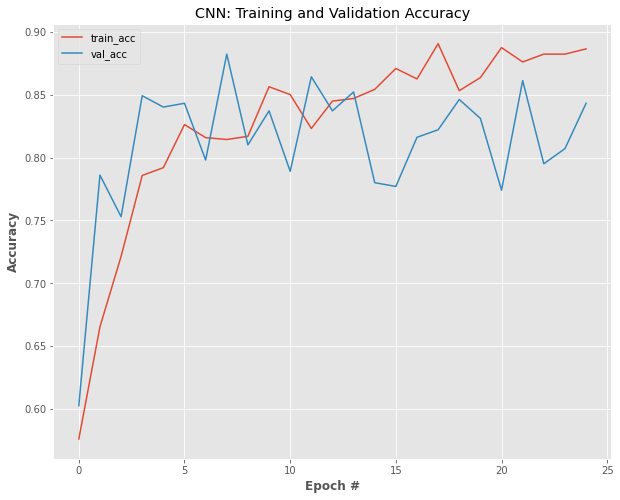

In [23]:
# plot the training and validation accuracy
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

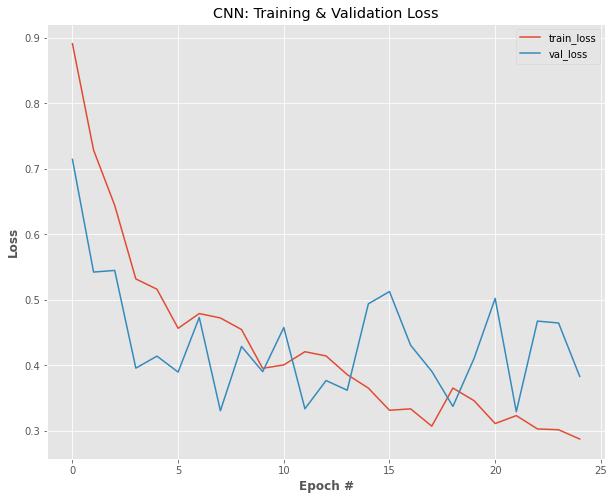

In [24]:
# plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("CNN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

### Step 9: Saving the train model

In [ ]:
# save the model to disk

print("[INFO] serializing network...")
model.save(MODEL, save_format="h5")

### Step 10: Making predictions using your trained tensorflow model

In [25]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [27]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading network and...


  0%|          | 0/28 [00:00<?, ?it/s]

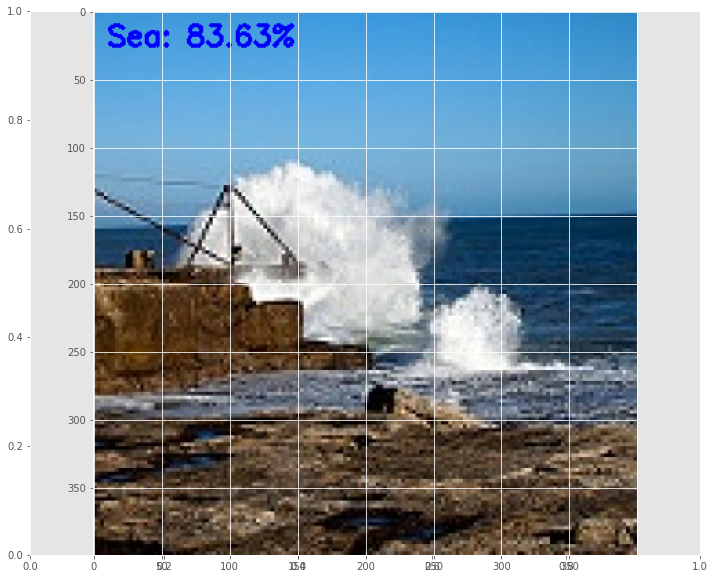

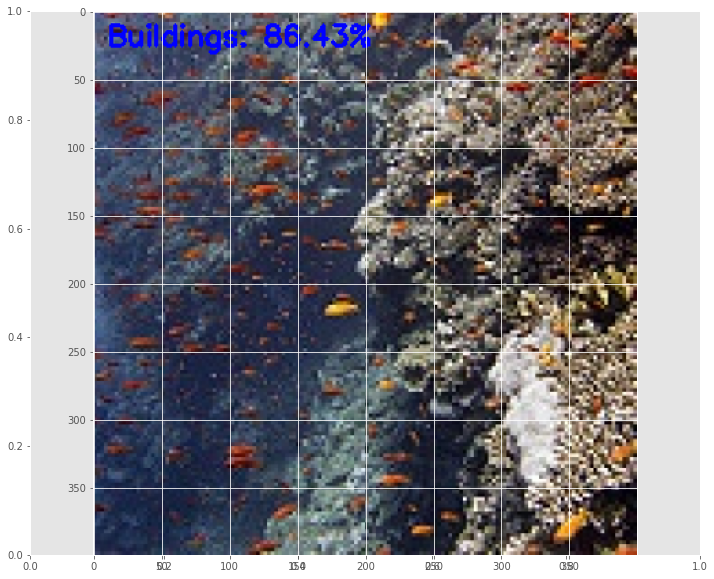

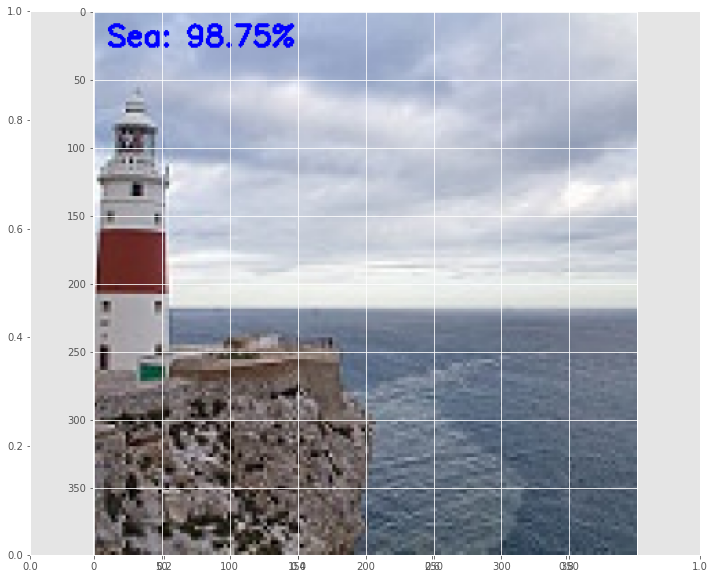

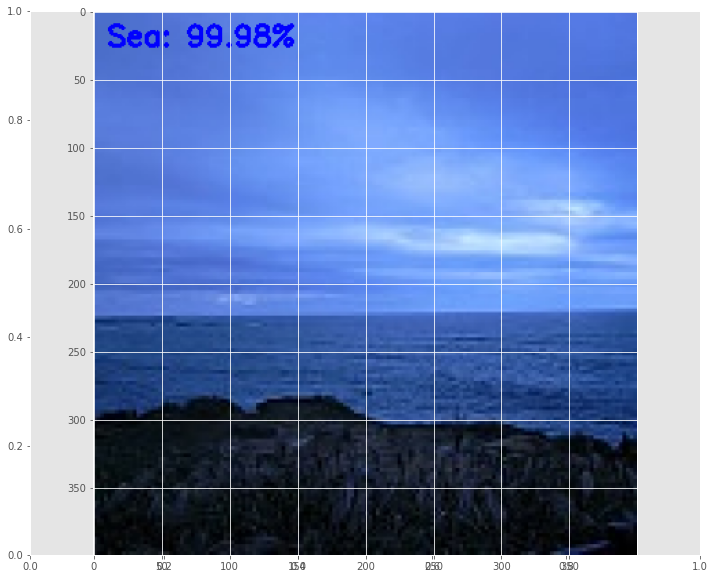

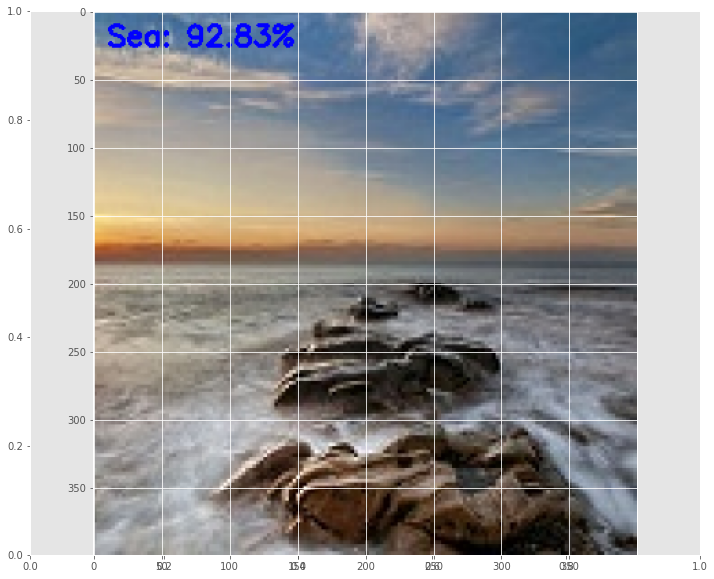

...

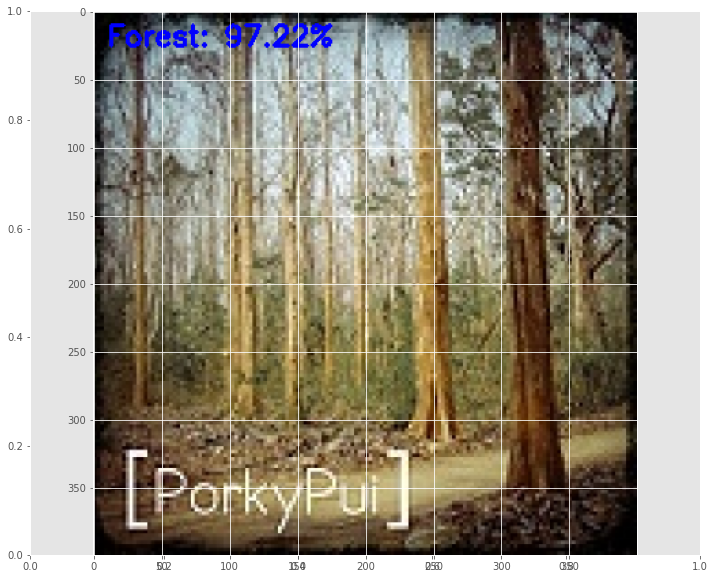

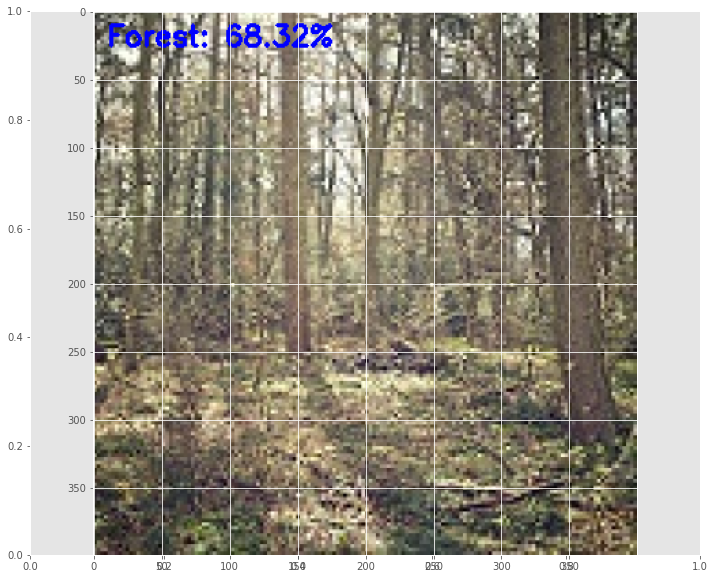

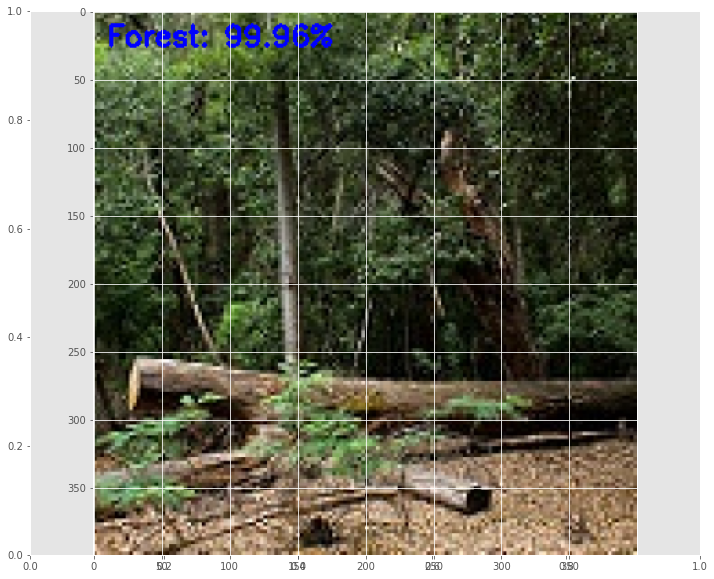

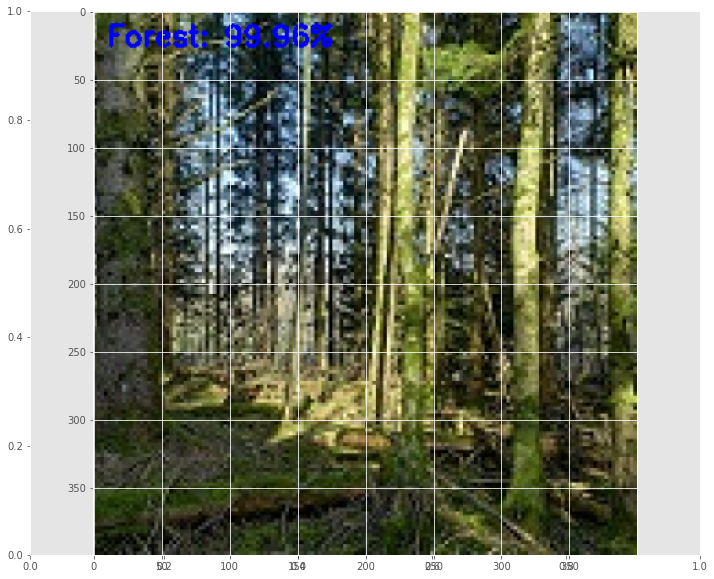

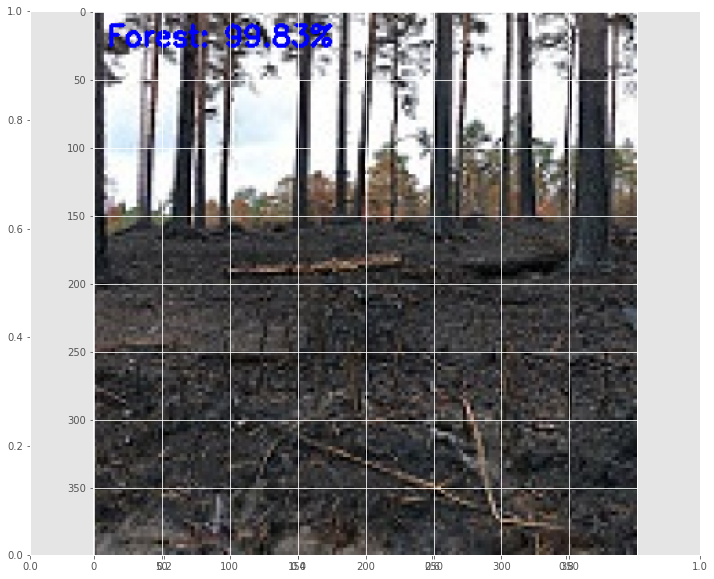

In [30]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2

# # load the model 
print("[INFO] loading network and...")
model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('test_examples')))   # data folder with 2 categorical folders

all_class = ["Buildings", "Forest", "Sea"]


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        
        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf = model.predict(image)[0]

        # build the label
        label = all_class[np.argmax(prd_conf)]
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 0, 0), 2)
        
        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)
        
        pbar.update(1)


### Deployment

In [31]:
import gradio as gr

In [32]:
def predict_image(image):
    # load the image
    
    # pre-process the image for classification
    image = cv2.resize(image, (28, 28))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

        
    preds = model.predict(image)[0]
    result = dict()
    result["Buildings"] = round(float(list(preds)[0]), 3)
    result["Forest"] = round(float(list(preds)[1]), 3)
    result["Sea"] = round(float(list(preds)[2]), 3)
    
    print(result)
    
    return result

In [33]:
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo").launch(share=True)

Running locally at: http://127.0.0.1:7860/
This share link will expire in 24 hours. If you need a permanent link, visit: https://gradio.app/introducing-hosted (NEW!)
Running on External URL: https://27752.gradio.app
Interface loading below...


(<Flask 'gradio.networking'>,
 'http://127.0.0.1:7860/',
 'https://27752.gradio.app')

{'Buildings': 0.734, 'Forest': 0.007, 'Sea': 0.26}
{'Buildings': 0.989, 'Forest': 0.002, 'Sea': 0.01}
{'Buildings': 0.989, 'Forest': 0.002, 'Sea': 0.01}


[2021-06-20 15:38:53,693] ERROR in app: Exception on /api/flag/ [POST]
Traceback (most recent call last):
  File "C:\Users\LENOVO\Anaconda3\lib\shutil.py", line 566, in move
    os.rename(src, real_dst)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\LENOVO\\AppData\\Local\\Temp\\okkfukgd.jpeg' -> 'C:\\Users\\LENOVO\\Desktop\\Deep_Learning_Imarticus\\2. Image classification using CNN\\flagged\\image\\2.jpeg'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\LENOVO\Anaconda3\lib\site-packages\flask\app.py", line 2446, in wsgi_app
    response = self.full_dispatch_request()
  File "C:\Users\LENOVO\Anaconda3\lib\site-packages\flask\app.py", line 1951, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "C:\Users\LENOVO\Anaconda3\lib\site-packages\flask_cors\extension.py", line 165, in wrapped_function
    return cors_after_re

{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.492, 'Forest': 0.312, 'Sea': 0.196}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.792, 'Forest': 0.0, 'Sea': 0.208}
{'Buildings': 0.0, 'Forest': 0.0, 'Sea': 1.0}
{'Buildings': 0.976, 'Forest': 0.0, 'Sea': 0.024}
{'Buildings': 0.98, 'Forest': 0.001, 'Sea': 0.019}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.249, 'Forest': 0.001, 'Sea': 0.75}
{'Buildings': 0.0, 'Forest': 0.012, 'Sea': 0.988}


In [34]:
import tensorflow as tf
print(tf.__version__)

2.0.0
{'Buildings': 0.0, 'Forest': 0.012, 'Sea': 0.988}
{'Buildings': 0.0, 'Forest': 0.012, 'Sea': 0.988}
